# Definitions

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, platform, os
os.environ['OMP_NUM_THREADS'] = '8'
import matplotlib
import math
from matplotlib import pyplot as plt
import numpy as np
import euclidemu2
import scipy
import cosmolike_des_y3_interface as ci
from getdist import IniFile
import itertools
import iminuit
import functools
print(sys.version)
print(os.getcwd())

# GENERAL PLOT OPTIONS
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
matplotlib.rcParams['xtick.bottom'] = True
matplotlib.rcParams['xtick.top'] = False
matplotlib.rcParams['ytick.right'] = False
matplotlib.rcParams['axes.edgecolor'] = 'black'
matplotlib.rcParams['axes.linewidth'] = '1.0'
matplotlib.rcParams['axes.labelsize'] = 'medium'
matplotlib.rcParams['axes.grid'] = True
matplotlib.rcParams['grid.linewidth'] = '0.0'
matplotlib.rcParams['grid.alpha'] = '0.18'
matplotlib.rcParams['grid.color'] = 'lightgray'
matplotlib.rcParams['legend.labelspacing'] = 0.77
matplotlib.rcParams['savefig.bbox'] = 'tight'
matplotlib.rcParams['savefig.format'] = 'pdf'
matplotlib.rcParams['text.usetex'] = True

# Jupyter Notebook Display options
import IPython
IPython.display.display(IPython.display.HTML("<style>:root { --jp-notebook-max-width: 85% !important; }</style>"))
IPython.display.display(IPython.display.HTML("<style>div.output_scroll { height: 54em; }</style>"))

3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) 
[GCC 12.3.0]
/home/vivianmiranda/extra_data/Vivian/cocoa2025/cocoa/Cocoa/projects/des_y3


In [2]:
# IMPORT CAMB
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/CAMB/build/lib.linux-x86_64-'+os.environ['PYTHON_VERSION'])
import camb
from camb import model
print('Using CAMB %s installed at %s'%(camb.__version__,os.path.dirname(camb.__file__)))

# IMPORT SHARED NOTEBOOK UTILITIES (cosmolike_core)
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/cosmolike_core')
import cosmolike_notebook_utils as cnu
print('Using cosmolike_notebook_utils installed at %s'%(os.path.dirname(cnu.__file__)))


Using CAMB 1.5.5 installed at /home/vivianmiranda/extra_data/Vivian/cocoa2025/cocoa/Cocoa/external_modules/code/CAMB/build/lib.linux-x86_64-3.9/camb


In [3]:
CAMBAccuracyBoost = 1.1
non_linear_emul = 2
CLprobe="3x2pt"

path= "../../external_modules/data/des_y3"
data_file="des_y3_real.dataset"

IA_model = 1
IA_redshift_evolution = 3
IA_code = 0  # 0 = C FASTPT, 1 = Python FAST-PT (NLA always uses 0)

ntheta = 20 
theta_min_arcmin = 2.5 
theta_max_arcmin = 250 

In [4]:
As_1e9 = 2.1
ns = 0.96605
H0 = 67.32
omegab = 0.04
omegam = 0.3
mnu = 0.06
DES_DZ_S1 = 0.0414632
DES_DZ_S2 = 0.00147332
DES_DZ_S3 = 0.0237035
DES_DZ_S4 = -0.0773436
DES_M1 = 0.0191832
DES_M2 = -0.0431752
DES_M3 = -0.034961
DES_M4 = -0.0158096
DES_A1_1 = 0.606102
DES_A1_2 = -1.51541
DES_A2_1 = -1.7938938475734911 
DES_A2_2 = -1.5448080290038528
DES_BTA_1 = 0.8154011496506723
DES_DZ_L1 = 0.00457604
DES_DZ_L2 = 0.000309875
DES_DZ_L3 = 0.00855907
DES_DZ_L4 = -0.00316269
DES_DZ_L5 = -0.0146753
DES_B1_1 = 1.72716
DES_B1_2 = 1.65168
DES_B1_3 = 1.61423
DES_B1_4 = 1.92886
DES_B1_5 = 2.11633
w0pwa = -0.9
w = -0.9
DES_BMAG_1 = 0.63
DES_BMAG_2 = -3.04
DES_BMAG_3 = -1.33
DES_BMAG_4 = 2.50
DES_BMAG_5 = 1.93
DES_PM_1 = 0.0
DES_PM_2 = 0.0
DES_PM_3 = 0.0
DES_PM_4 = 0.0
DES_PM_5 = 0.0

In [5]:
# get_camb_cosmology lives in cosmolike_core, shared by every project's
# notebooks; call it as cnu.get_camb_cosmology (imported above). This
# notebook migrated from an older private copy: the shared version
# folds only a third of AccuracyBoost into the CAMB boost, scales
# kmax and the chi(z) node count with the CAMB boost (no floors),
# scales lens_potential_accuracy, and masks the EuclidEmulator2
# branch to z < 10.


In [6]:
def C_gs_tomo_limber(ell, 
                     omegam = omegam, 
                     omegab = omegab, 
                     H0 = H0, 
                     ns = ns, 
                     As_1e9 = As_1e9, 
                     w = w, 
                     w0pwa = w0pwa,
                     A1  = [DES_A1_1, DES_A1_2, 0, 0, 0], 
                     A2  = [DES_A2_1, DES_A2_2, 0, 0, 0],
                     BTA = [DES_BTA_1, 0, 0, 0, 0],
                     shear_photoz_bias = [DES_DZ_S1, DES_DZ_S2, DES_DZ_S3, DES_DZ_S4],
                     M = [DES_M1, DES_M2, DES_M3, DES_M4],
                     lens_photoz_bias = [DES_DZ_L1, DES_DZ_L2, DES_DZ_L3, DES_DZ_L4, DES_DZ_L5],
                     galaxy_bias_b1 = [DES_B1_1, DES_B1_2, DES_B1_3, DES_B1_4, DES_B1_5],
                     galaxy_bias_b2 = [0,0,0,0,0],
                     galaxy_bias_bmag = [DES_BMAG_1,DES_BMAG_2,DES_BMAG_3,DES_BMAG_4,DES_BMAG_5],
                     baryon_sims = None,
                     AccuracyBoost = 1.0, 
                     kmax = 10, 
                     k_per_logint = 20, 
                     CAMBAccuracyBoost=1.0,
                     CLAccuracyBoost = 1.1, 
                     CLIntegrationAccuracy = 0):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, non_linear_emul=non_linear_emul,
            AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(AccuracyBoost-1.0))
    
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_shear_calib(M = M)
    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)
    ci.set_nuisance_ia(A1 = A1, A2 = A2, B_TA = BTA)
    
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = [0,0,0,0,0],
                         BK = [0,0,0,0,0])
   

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)
    
    return ci.C_gs_tomo_limber(l = ell)

In [7]:
def C_gg_tomo(ell,
              limber,
              omegam = omegam, 
              omegab = omegab, 
              H0 = H0, 
              ns = ns, 
              As_1e9 = As_1e9, 
              w = w, 
              w0pwa = w0pwa,
              lens_photoz_bias = [DES_DZ_L1, DES_DZ_L2, DES_DZ_L3, DES_DZ_L4, DES_DZ_L5],
              galaxy_bias_b1 = [DES_B1_1, DES_B1_2, DES_B1_3, DES_B1_4, DES_B1_5],
              galaxy_bias_b2 = [0,0,0,0,0],
              galaxy_bias_bmag = [DES_BMAG_1,DES_BMAG_2,DES_BMAG_3,DES_BMAG_4,DES_BMAG_5],
              baryon_sims = None,
              AccuracyBoost = 1.0, 
              kmax = 10, 
              k_per_logint = 20, 
              CAMBAccuracyBoost=1.1,
              CLAccuracyBoost = 1.0, 
              CLIntegrationAccuracy = 0):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, non_linear_emul=non_linear_emul,
            AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(AccuracyBoost-1.0))
    
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
 
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = [0,0,0,0,0],
                         BK = [0,0,0,0,0])
   
    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)

    if limber == 1:
        return ci.C_gg_tomo_limber(l = ell)
    else:
        return ci.C_gg_tomo(l = ell)

In [8]:
def gamma_t(ntheta = ntheta, 
            theta_min_arcmin = theta_min_arcmin, 
            theta_max_arcmin = theta_max_arcmin,
            omegam = omegam, 
            omegab = omegab, 
            H0 = H0, 
            ns = ns, 
            As_1e9 = As_1e9, 
            w = w, 
            w0pwa = w0pwa,
            A1  = [DES_A1_1, DES_A1_2, 0, 0, 0], 
            A2  = [DES_A2_1, DES_A2_2, 0, 0, 0],
            BTA = [DES_BTA_1, 0, 0, 0, 0],
            shear_photoz_bias = [DES_DZ_S1, DES_DZ_S2, DES_DZ_S3, DES_DZ_S4],
            M = [DES_M1, DES_M2, DES_M3, DES_M4],
            lens_photoz_bias = [DES_DZ_L1, DES_DZ_L2, DES_DZ_L3, DES_DZ_L4, DES_DZ_L5],
            galaxy_bias_b1 = [DES_B1_1, DES_B1_2, DES_B1_3, DES_B1_4, DES_B1_5],
            galaxy_bias_b2 = [0,0,0,0,0],
            galaxy_bias_bmag = [DES_BMAG_1,DES_BMAG_2,DES_BMAG_3,DES_BMAG_4,DES_BMAG_5],
            PM = [DES_PM_1, DES_PM_2, DES_PM_3, DES_PM_4, DES_PM_5],
            baryon_sims = None,
            AccuracyBoost = 1.0, 
            kmax = 10, 
            k_per_logint = 20, 
            CAMBAccuracyBoost=1.1,
            CLAccuracyBoost = 1.0, 
            CLIntegrationAccuracy = 0):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, non_linear_emul=non_linear_emul,
            AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(AccuracyBoost-1.0))
    
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_binning(int(ntheta), theta_min_arcmin, theta_max_arcmin)
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_shear_calib(M = M)
    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = [0,0,0,0,0],
                         BK = [0,0,0,0,0])
    ci.set_nuisance_ia(A1 = A1, A2 = A2, B_TA = BTA)
    ci.set_point_mass(PMV=PM) 

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)
    
    return (ci.get_binning_real_space(), ci.w_gammat_tomo())  

In [9]:
def w_theta(ntheta = ntheta, 
            theta_min_arcmin = theta_min_arcmin, 
            theta_max_arcmin = theta_max_arcmin,
            omegam = omegam, 
            omegab = omegab, 
            H0 = H0, 
            ns = ns, 
            As_1e9 = As_1e9, 
            w = w, 
            w0pwa = w0pwa,
            lens_photoz_bias = [DES_DZ_L1, DES_DZ_L2, DES_DZ_L3, DES_DZ_L4, DES_DZ_L5],
            galaxy_bias_b1 = [DES_B1_1, DES_B1_2, DES_B1_3, DES_B1_4, DES_B1_5],
            galaxy_bias_b2 = [0,0,0,0,0],
            galaxy_bias_bmag = [DES_BMAG_1,DES_BMAG_2,DES_BMAG_3,DES_BMAG_4,DES_BMAG_5],
            baryon_sims = None,
            AccuracyBoost = 1.0, 
            kmax = 10, 
            k_per_logint = 20, 
            CAMBAccuracyBoost=1.1,
            CLAccuracyBoost = 1.0, 
            CLIntegrationAccuracy = 0):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, non_linear_emul=non_linear_emul,
            AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(AccuracyBoost-1.0))
    
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_binning(int(ntheta), theta_min_arcmin, theta_max_arcmin)
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = [0,0,0,0,0],
                         BK = [0,0,0,0,0])

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)
    
    return (ci.get_binning_real_space(), ci.w_gg_tomo())  

In [10]:
# plot_C_gs_tomo_limber lives in cosmolike_core (shared); call it as
# cnu.plot_C_gs_tomo_limber (imported above). The shared version
# also fixes the panel-grid orientation for unequal lens/source bin
# counts (rows = source bins, columns = lens bins).


In [11]:
# plot_C_gg_tomo lives in cosmolike_core (shared); call it as
# cnu.plot_C_gg_tomo (imported above)


In [12]:
# plot_gammat_tomo_limber lives in cosmolike_core (shared); call it
# as cnu.plot_gammat_tomo_limber (imported above). The shared version
# also fixes the panel-grid orientation for unequal lens/source bin
# counts and takes thetashow for the x range.


In [13]:
# plot_wtheta_tomo lives in cosmolike_core (shared); call it as
# cnu.plot_wtheta_tomo (imported above)


In [14]:
# Init Cosmolike
ini = IniFile(os.path.normpath(os.path.join(path, data_file)))

lens_file = ini.relativeFileName('nz_lens_file')

source_file = ini.relativeFileName('nz_source_file')

lens_ntomo = ini.int("lens_ntomo")

source_ntomo = ini.int("source_ntomo")

ci.initial_setup()

ci.init_accuracy_boost(1.0, int(1))

ci.init_cosmo_runmode(is_linear = False)

ci.init_redshift_distributions_from_files(
      lens_multihisto_file=lens_file,
      lens_ntomo=int(lens_ntomo), 
      source_multihisto_file=source_file,
      source_ntomo=int(source_ntomo))

ci.init_IA( ia_model = int(IA_model), 
            ia_redshift_evolution = int(IA_redshift_evolution),
            ia_code = int(IA_code))

# Let's plot how cosmological and nuisance parameters affect $C_{\ell}^{gs}$

In [15]:
ell = np.arange(25., 2500., 3.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell, omegam=x))

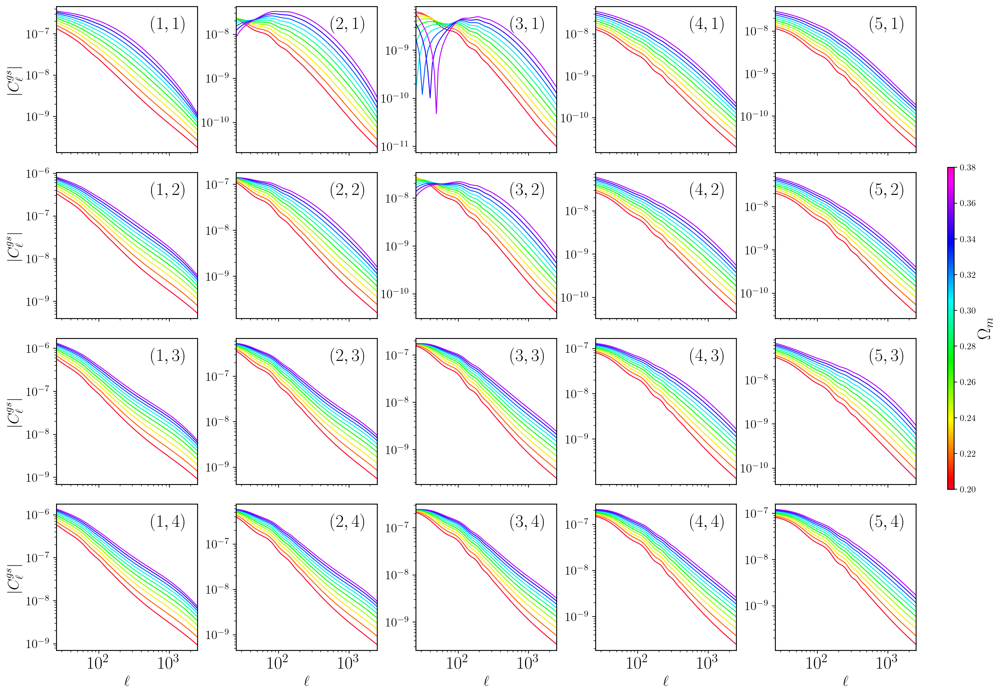

In [16]:
cnu.plot_C_gs_tomo_limber(ell=ell, C_gs=np.abs(C_gs), param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
                      lmin=ell[0],lmax=ell[len(ell)-1],
                      figsize = (21, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

In [17]:
ell = np.arange(25., 2500., 3.) # Make sure arange are with float numbers (otherwise there are aliasing problems)
param = np.arange(0.85, 1.1, 0.02)
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell, ns=x))

# Plot the Ratio over ref cosmology
ref = C_gs_tomo_limber(ell=ell)

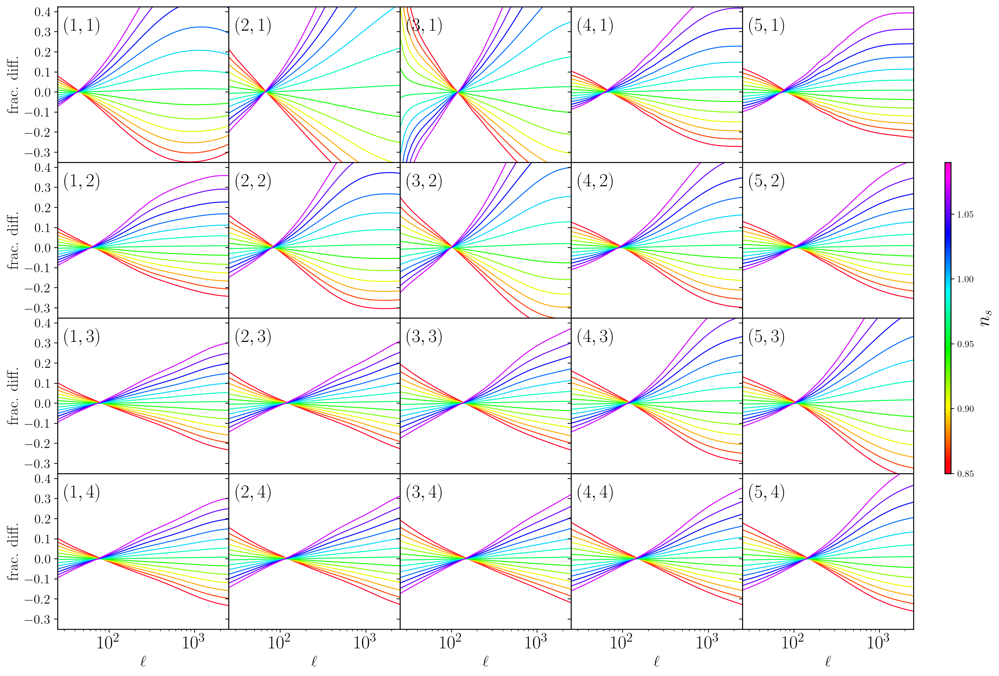

In [18]:
cnu.plot_C_gs_tomo_limber(ell=ell, C_gs=C_gs, C_gs_ref=ref, param=param, colorbarlabel="$n_s$", bintextpos = [0.15, 0.875], ylim = [0.65,1.425],
                     lmin=ell[0],lmax=ell[len(ell)-1],
                     figsize = (20, 12), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $\gamma_t(\theta)$

In [19]:
param = np.arange(0.2, 0.4, 0.02)   
gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(omegam = x))

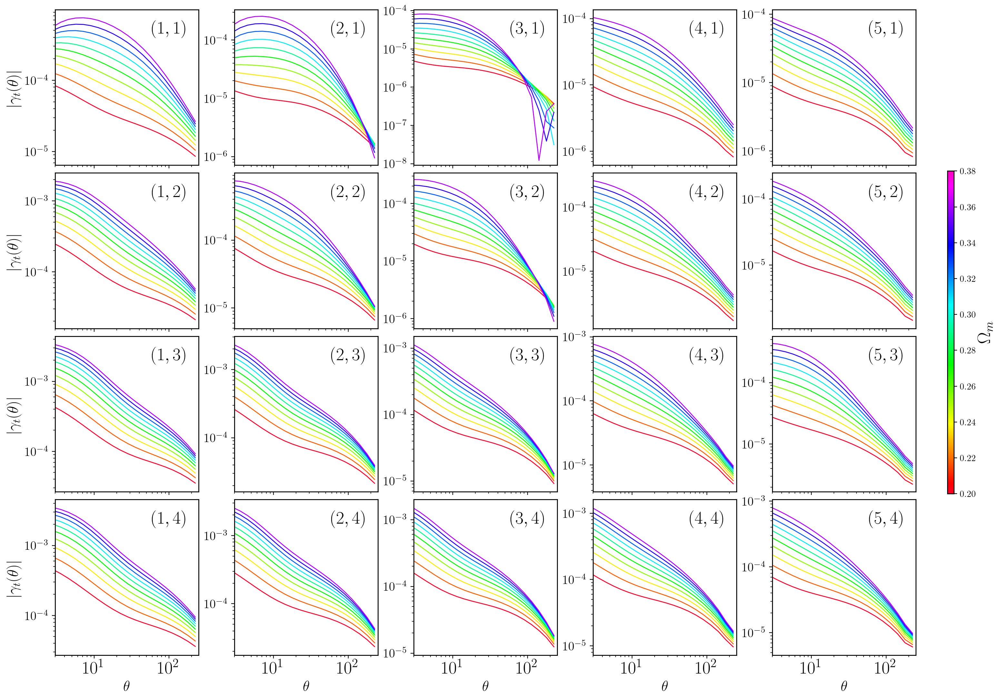

In [20]:
cnu.plot_gammat_tomo_limber(theta_gammat = gammat_theta, gammat_ref = None, param = param, colorbarlabel = "$\Omega_m$",
                       bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
                       figsize = (21, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Can we change the binning on $\gamma_t(\theta)$ w/o restarting the kernel? Yes!
Why this is a nontrivial question? Because Cosmolike uses static variables to cache internal variables

In [21]:
nthetas=[9, 12, 17, 44]
gammat_theta = []
for x in nthetas:
    gammat_theta.append(gamma_t(ntheta=x))

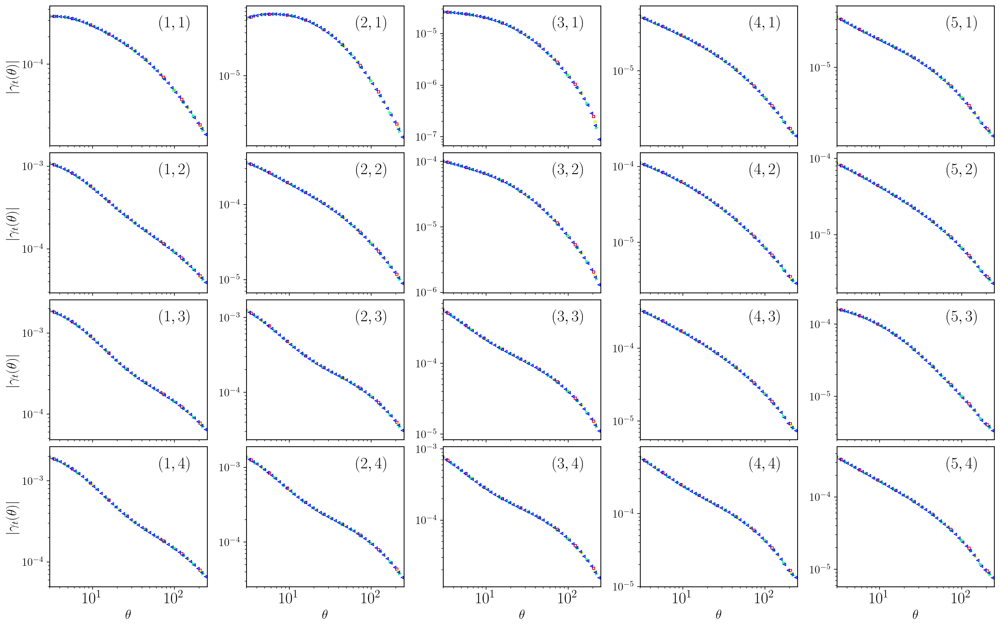

In [22]:
cnu.plot_gammat_tomo_limber(theta_gammat = gammat_theta, marker=['s', 'o', ">", "<"], ylim = [0.75,1.3], bintextpos = [0.8, 0.875],
                        figsize = (21, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Add Baryon Contamination to $C_{\ell}^{gs}$ and $\gamma_t(\theta)$ data vectors

In [23]:
ell = np.arange(3., 7500., 10.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = ("TNG100-1", "HzAGN-1", "mb2-1", "illustris-1", "eagle-1", "owls_AGN-1", "owls_AGN-2", "owls_AGN-3", "BAHAMAS-2")
    
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell,baryon_sims=x))
    
# Plot the Ratio over ref cosmology
C_gs_ref = C_gs_tomo_limber(ell=ell)

gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(baryon_sims=x, ntheta=40, AccuracyBoost=1.0))
gammat_theta_ref = gamma_t(ntheta=40, AccuracyBoost=1.0)

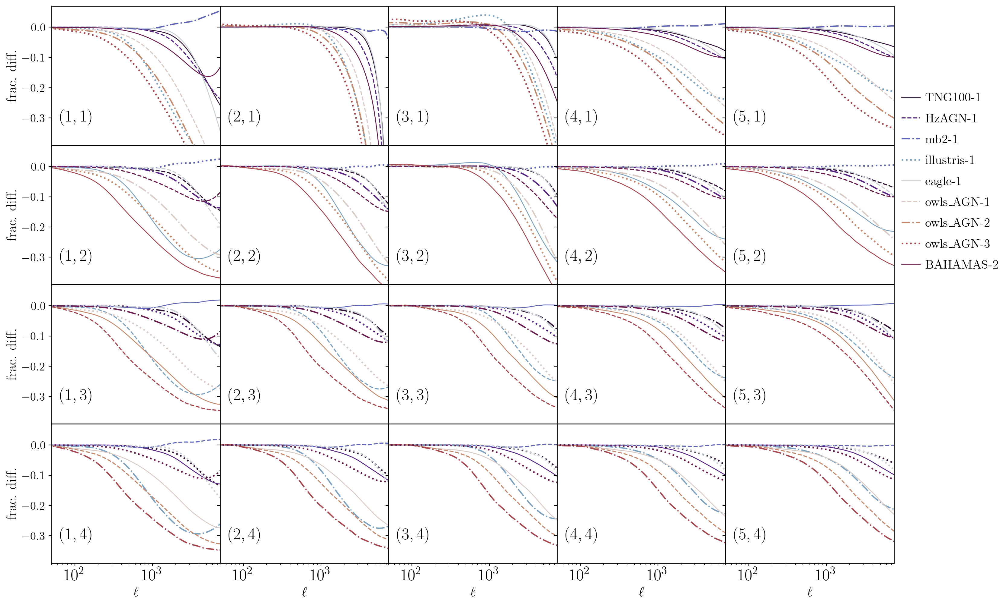

In [24]:
matplotlib.rcParams['legend.fontsize'] = 15
cnu.plot_C_gs_tomo_limber(ell=ell, C_gs=C_gs, C_gs_ref=C_gs_ref, lmin=50,lmax=ell[len(ell)-1], cmap="twilight_shifted", 
                      bintextpos = [0.15, 0.2], ylim = [0.61,1.07], legend = param, legendloc=(0.9,0.55),
                      linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                      figsize = (18, 12), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)

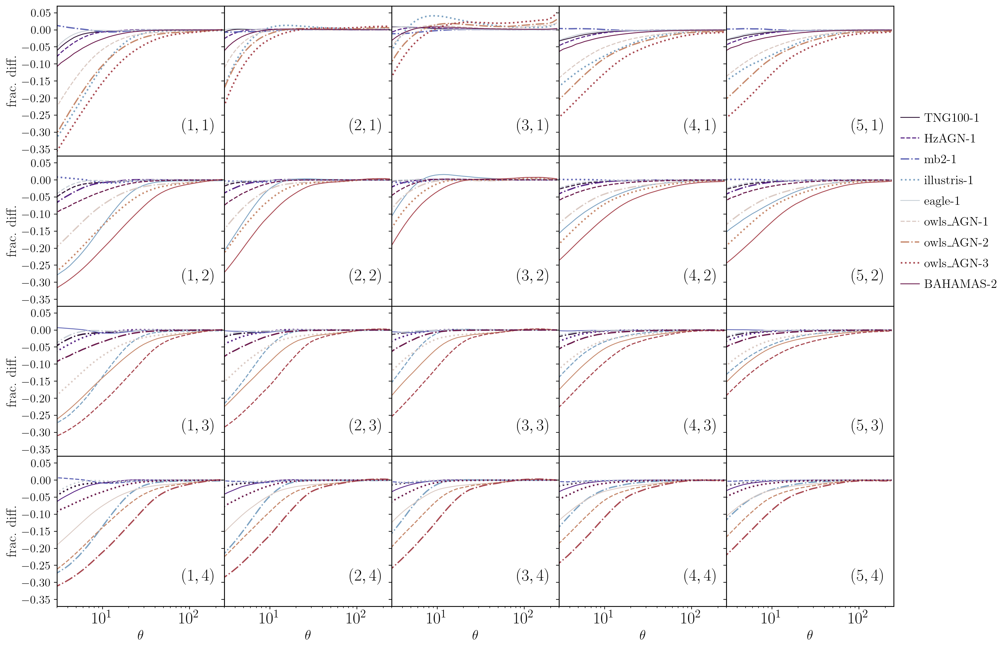

In [25]:
cnu.plot_gammat_tomo_limber(theta_gammat=gammat_theta, gammat_ref=gammat_theta_ref,cmap="twilight_shifted",
                       bintextpos = [0.85, 0.2], ylim = [0.63,1.07], legend = param, legendloc=(0.9,0.55),
                       linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                       figsize = (18, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Check how CAMB and Cosmolike Accuracy Boost affect $C_\ell^{\rm gs}$ and $\gamma_t(\theta)$ data vectors

In [26]:
ell = np.arange(10., 8500., 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)

param = np.arange(0.6, 2.0, 0.2)

C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell,AccuracyBoost=x))
    
# Plot the Ratio over ref cosmology
C_gs_ref = C_gs_tomo_limber(ell=ell)

gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(ntheta=40, AccuracyBoost=x))
gammat_theta_ref = gamma_t(ntheta=40, AccuracyBoost=1.0)

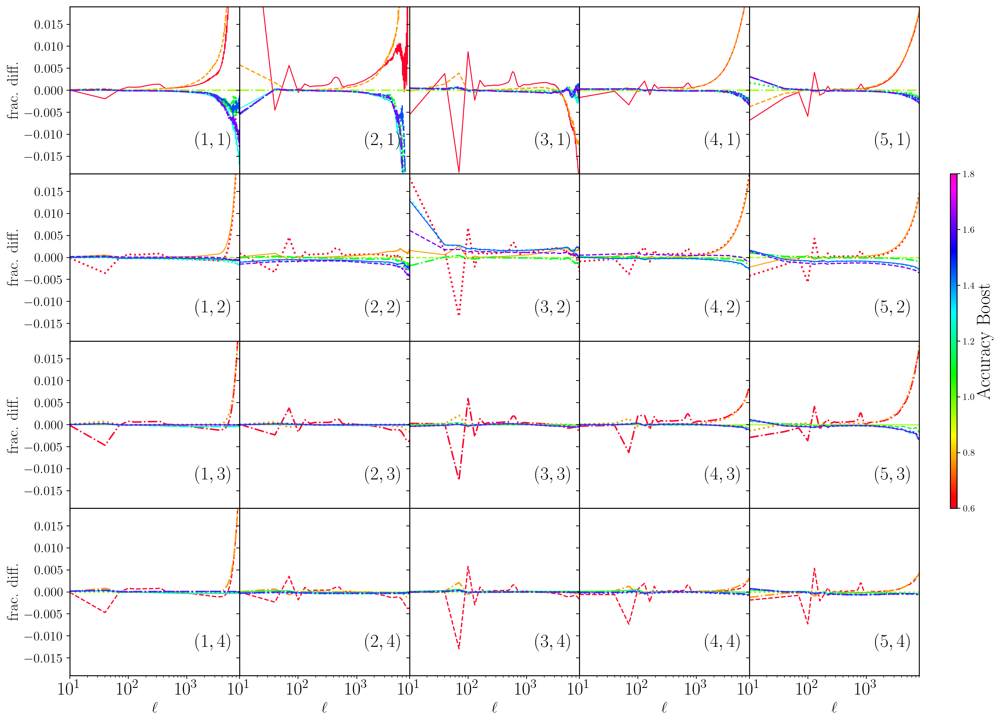

In [27]:
cnu.plot_C_gs_tomo_limber(ell=ell, C_gs=C_gs, C_gs_ref=C_gs_ref, param=param, lmin=10, lmax=8000, ylim=(0.981,1.019), bintextpos = [0.85, 0.2],
                      colorbarlabel="Accuracy Boost", linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                      figsize = (20, 13), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)

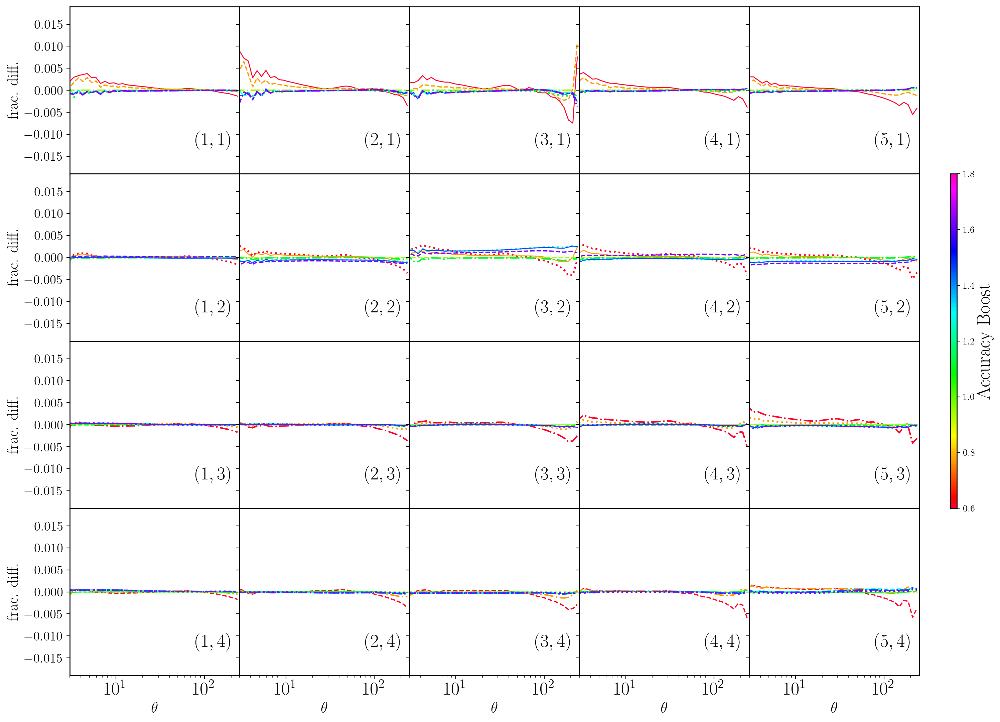

In [28]:
cnu.plot_gammat_tomo_limber(theta_gammat=gammat_theta, gammat_ref=gammat_theta_ref,
                       bintextpos = [0.85, 0.2], ylim = (0.981,1.019), param=param, legendloc=(0.9,0.55), colorbarlabel="Accuracy Boost",
                       linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                       figsize = (20, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $C_{\ell}^{gg}$ (Non-Limber/Limber)

In [29]:
ell = np.arange(3., 2500., 3.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
C_gg_L = []
C_gg_NL = []
ratio = []
for x in param:
    tmp1 = C_gg_tomo(ell=ell, limber=1, omegam=x)
    tmp2 = C_gg_tomo(ell=ell, limber=0, omegam=x)
    C_gg_L.append(tmp1)
    C_gg_NL.append(tmp2)

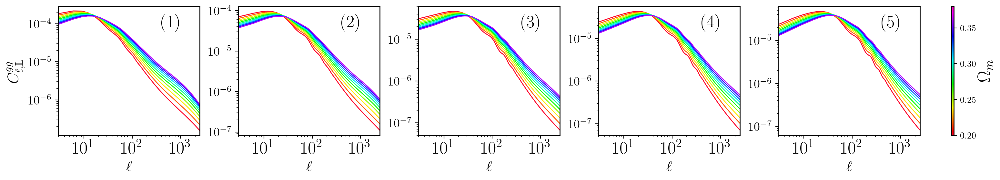

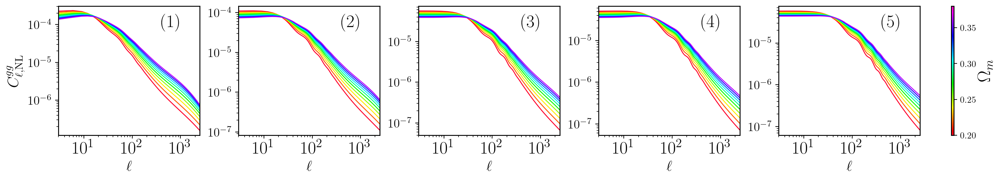

In [30]:
cnu.plot_C_gg_tomo(ell=ell, C_gg=C_gg_L, param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
               lmin=ell[0],lmax=ell[len(ell)-1], overwriteylabel="$C_{\ell,{\\rm L}}^{gg}$",
               figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)
cnu.plot_C_gg_tomo(ell=ell, C_gg=C_gg_NL, param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
               lmin=ell[0],lmax=ell[len(ell)-1], overwriteylabel="$C_{\ell,{\\rm NL}}^{gg}$",
               figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

In [31]:
ell = np.arange(3., 250., 1.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
ratio = []
for x in param:
    tmp1 = C_gg_tomo(ell=ell, limber=1, omegam=x)
    tmp2 = C_gg_tomo(ell=ell, limber=0, omegam=x)
    ratio.append(tmp2/tmp1)

/tmp/ipykernel_501441/2098546462.py:7: RuntimeWarning: invalid value encountered in divide
  ratio.append(tmp2/tmp1)


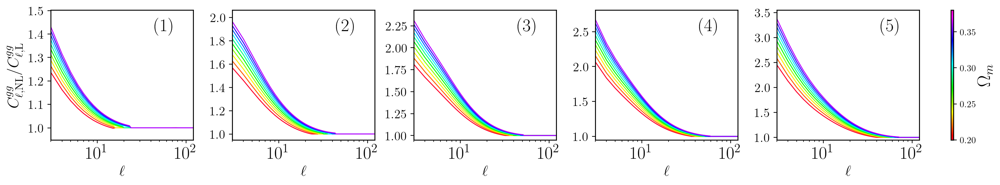

In [32]:
cnu.plot_C_gg_tomo(ell=ell, C_gg=ratio, param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.95,1.05],
               lmin=3,lmax=120, forcelinearyscale=True, overwriteylabel="$C_{\ell,{\\rm NL}}^{gg}/C_{\ell,{\\rm L}}^{gg}$",
               forcelinearxscale=False, marker=None,
               figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $w(\theta)$

In [33]:
param = np.arange(0.2, 0.4, 0.02)   
wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(omegam = x))

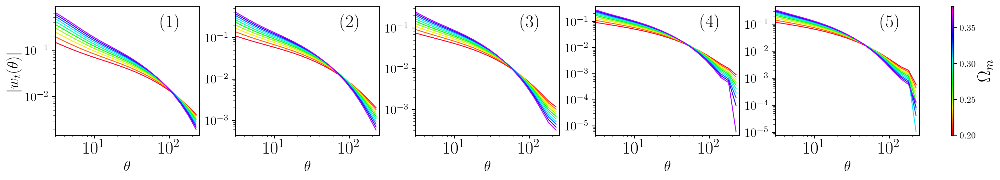

In [34]:
cnu.plot_wtheta_tomo(theta_wtheta = wtheta_theta, theta_wtheta_ref = None, param = param, colorbarlabel = "$\Omega_m$",
                 bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
                 figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Can we change the binning on $w(\theta)$ w/o restarting the kernel? Yes!
Why this is a nontrivial question? Because Cosmolike uses static variables to cache internal variables

In [35]:
nthetas=[9, 12, 17, 44]
wtheta_theta = []
for x in nthetas:
    wtheta_theta.append(w_theta(ntheta=x))

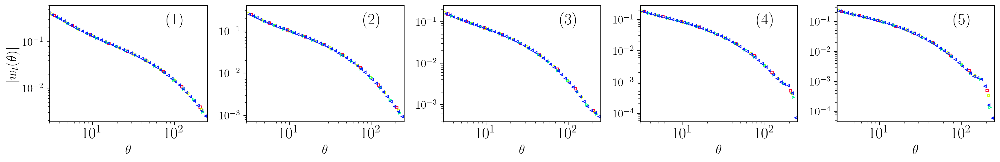

In [36]:
cnu.plot_wtheta_tomo(theta_wtheta=wtheta_theta, marker=['s', 'o', ">", "<"], ylim = [0.75,1.3], bintextpos = [0.8, 0.875],
                 figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Add Baryon Contamination to $C_{\ell}^{gg}$ and $w(\theta)$ data vectors

In [37]:
ell = np.arange(3., 7500., 10.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = ("TNG100-1", "HzAGN-1", "mb2-1", "illustris-1", "eagle-1", "owls_AGN-1", "owls_AGN-2", "owls_AGN-3", "BAHAMAS-2")
    
C_gg = []
for x in param:
    C_gg.append(C_gg_tomo(ell=ell,limber=False,baryon_sims=x))
    
# Plot the Ratio over ref cosmology
C_gg_ref = C_gg_tomo(ell=ell,limber=False)

wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(baryon_sims=x, ntheta=40, AccuracyBoost=1.0))
wtheta_theta_ref = w_theta(ntheta=40, AccuracyBoost=1.0)

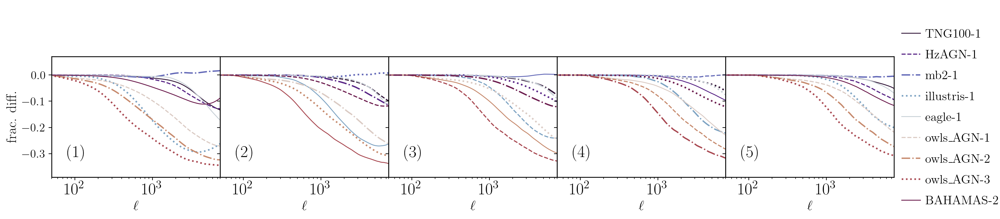

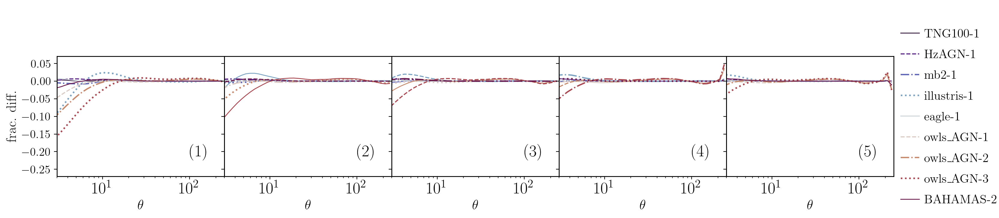

In [38]:
matplotlib.rcParams['legend.fontsize'] = 15
cnu.plot_C_gg_tomo(ell=ell, C_gg=C_gg, C_gg_ref=C_gg_ref, lmin=50,lmax=ell[len(ell)-1], cmap="twilight_shifted", 
               bintextpos = [0.15, 0.2], ylim = [0.61,1.07], legend = param, legendloc=(0.9,0.05),
               linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
               figsize = (18, 13./5), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)
cnu.plot_wtheta_tomo(theta_wtheta=wtheta_theta, theta_wtheta_ref=wtheta_theta_ref,cmap="twilight_shifted",
                 bintextpos = [0.85, 0.2], ylim = [0.73,1.07], legend = param, legendloc=(0.9,0.05),
                 linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                 figsize = (18, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

In [39]:
# Check how CAMB and Cosmolike Accuracy Boost affect $C_\ell^{\rm gg}$ and $\wheta(\theta)$ data vectors

In [40]:
ell = np.arange(10., 8500., 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.6, 2.0, 0.2)

C_gg = []
for x in param:
    C_gg.append(C_gg_tomo(ell=ell,limber=False,AccuracyBoost=x))
    
# Plot the Ratio over ref cosmology
C_gg_ref = C_gg_tomo(ell=ell,limber=False)

wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(ntheta=40, AccuracyBoost=x))
wtheta_theta_ref = w_theta(ntheta=40, AccuracyBoost=1.0)

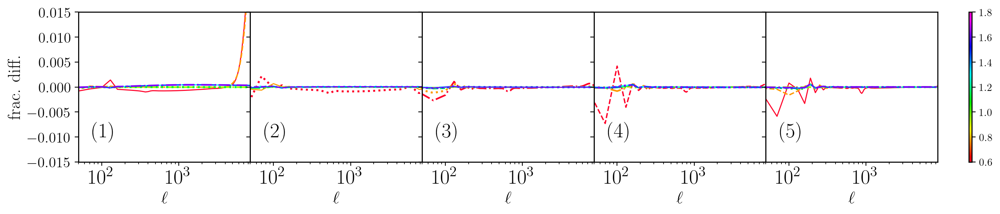

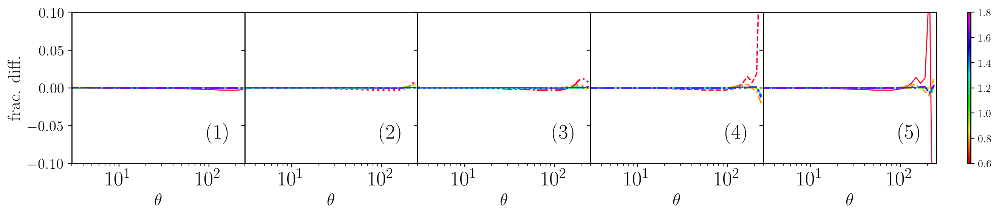

In [41]:
matplotlib.rcParams['legend.fontsize'] = 15
cnu.plot_C_gg_tomo(ell=ell, C_gg=C_gg, C_gg_ref=C_gg_ref, lmin=50,lmax=ell[len(ell)-1],
               bintextpos = [0.15, 0.2], ylim = [0.985,1.015], param = param, legendloc=(0.9,0.05),
               linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
               figsize = (18, 13./5), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)
cnu.plot_wtheta_tomo(theta_wtheta=wtheta_theta, theta_wtheta_ref=wtheta_theta_ref,
                 bintextpos = [0.85, 0.2], ylim = [0.9,1.1], param = param, legendloc=(0.9,0.05),
                 linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                 figsize = (18, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

## Let's compute $\chi^2_{\rm DES}$ and reproduce the results shown on EXAMPLE_EVALUATE2.YAML

In [75]:
non_linear_emul = 2
CLprobe="3x2pt"

path= "../../external_modules/data/des_y3"
data_file="des_y3_real.dataset"

IA_model = 1
IA_redshift_evolution = 3
IA_code = 0

ini = IniFile(os.path.normpath(os.path.join(path, data_file)))

ci.initial_setup()



ci.init_probes(possible_probes = CLprobe)

ci.init_binning(int(ini.int("n_theta")), 
                ini.float("theta_min_arcmin"), 
                ini.float("theta_max_arcmin"))

ci.init_cosmo_runmode(is_linear = False)

ci.init_IA( ia_model = int(IA_model), 
            ia_redshift_evolution = int(IA_redshift_evolution),
            ia_code = int(IA_code))

ci.init_redshift_distributions_from_files(
      lens_multihisto_file=ini.relativeFileName('nz_lens_file'),
      lens_ntomo=int(ini.int("lens_ntomo")), 
      source_multihisto_file=ini.relativeFileName('nz_source_file'),
      source_ntomo=int(ini.int("source_ntomo")))

ci.init_data_real(ini.relativeFileName('cov_file'), 
                  ini.relativeFileName('mask_file'), 
                  ini.relativeFileName('data_file'))

if CLprobe != "xi":
    ci.init_bias(bias_model=[0,0,0,1,0])

def get_chi2(omegam = omegam, 
             omegab = omegab, 
             H0 = H0, 
             ns = ns, 
             As_1e9 = As_1e9, 
             w = w, 
             w0pwa = w0pwa,
             A1  = [DES_A1_1, DES_A1_2, 0, 0, 0], 
             A2  = [DES_A2_1, DES_A2_2, 0, 0, 0],
             BTA = [DES_BTA_1, 0, 0, 0, 0],
             shear_photoz_bias = [DES_DZ_S1, DES_DZ_S2, DES_DZ_S3, DES_DZ_S4],
             M = [DES_M1, DES_M2, DES_M3, DES_M4],
             lens_photoz_bias = [DES_DZ_L1, DES_DZ_L2, DES_DZ_L3, DES_DZ_L4, DES_DZ_L5],
             galaxy_bias_b1 = [DES_B1_1, DES_B1_2, DES_B1_3, DES_B1_4, DES_B1_5],
             galaxy_bias_b2 = [0,0,0,0,0],
             galaxy_bias_bmag = [DES_BMAG_1,DES_BMAG_2,DES_BMAG_3,DES_BMAG_4,DES_BMAG_5],
             PM = [DES_PM_1, DES_PM_2, DES_PM_3, DES_PM_4, DES_PM_5],
             baryon_sims = None,
             AccuracyBoost=1.0, 
             kmax = 10, 
             k_per_logint = 20, 
             CAMBAccuracyBoost=1.1,
             CLAccuracyBoost=1.0, 
             CLIntegrationAccuracy = 1):

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(AccuracyBoost-1.0))

    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    
    # Set Nuisance Parameters
    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, non_linear_emul=non_linear_emul,
            AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost)
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)

    ci.set_nuisance_bias(B1=galaxy_bias_b1,
                         B2=galaxy_bias_b2,
                         B_MAG=galaxy_bias_bmag,
                         B3nl=[0,0,0,0,0],
                         BK=[0,0,0,0,0])

    ci.set_nuisance_clustering_photoz(bias=lens_photoz_bias)

    ci.set_point_mass(PMV=PM)
    
    ci.set_nuisance_shear_calib(M=M)

    ci.set_nuisance_shear_photoz(bias=shear_photoz_bias)

    ci.set_nuisance_ia(A1 = A1, 
                       A2 = A2, 
                       B_TA = BTA)

    datavector = np.array(ci.compute_data_vector_masked())
    return ci.compute_chi2(datavector)

In [76]:
print(rf"$\chi^2$={get_chi2(CLIntegrationAccuracy = 1):3.3f}")

$\chi^2$=1356.902


# Let's compute $\chi^2_{\rm DES}$ as function of Integration Accuracy

In [77]:
param = np.arange(0, 10, 1)      
chi2 = []
for x in param:
    chi2.append(get_chi2(CLIntegrationAccuracy = x))
chi2 = np.array(chi2)
chi2 = chi2 - chi2[0]

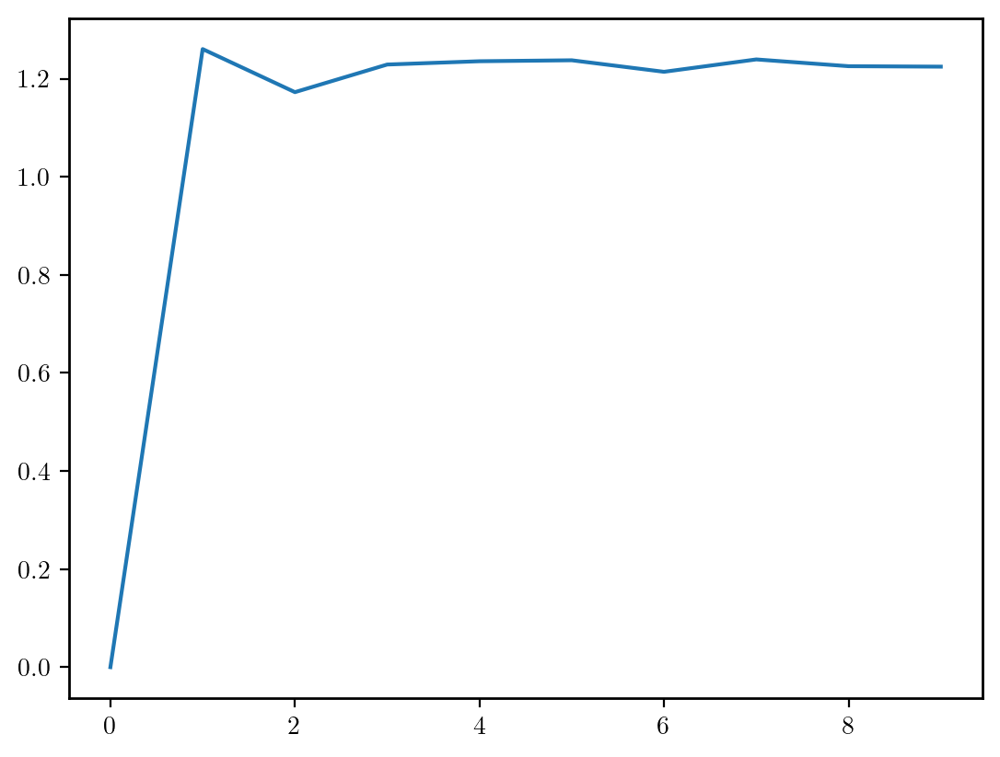

In [78]:
plt.plot(param, np.array(chi2))

# Let's compute $\chi^2_{\rm DES}$ as function of Cosmolike AccuracyBoost (Integration Accuracy = 1)

In [80]:
param = np.arange(1, 10, 1)      
chi2 = []
for x in param:
    chi2.append(get_chi2(CLAccuracyBoost=x, CLIntegrationAccuracy = 1))
chi2 = np.array(chi2)
chi2 = chi2 - chi2[0]

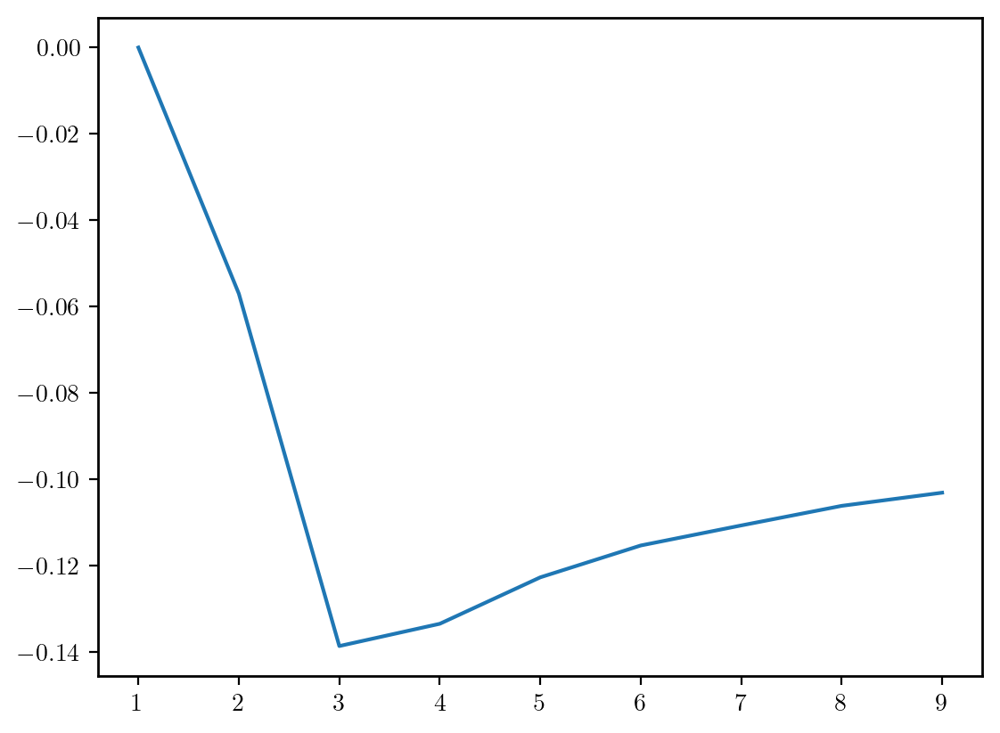

In [81]:
plt.plot(param, np.array(chi2))